<a href="https://colab.research.google.com/github/T-Yamaguch/SNGAN/blob/main/SNGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!nvidia-smi

Sun Oct 11 11:30:11 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0    33W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# !mkdir data_faces && wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip 

# import zipfile

# with zipfile.ZipFile("celeba.zip","r") as zip_ref:
#   zip_ref.extractall("data_faces/")

# import os
# root = 'data_faces/img_align_celeba'
# img_list = os.listdir(root)
# print(len(img_list))

In [4]:
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Concatenate, Conv2D, \
MaxPooling2D, Activation, ReLU, LeakyReLU, UpSampling2D, BatchNormalization, \
Dropout, Dense, Flatten, Add, LayerNormalization, GaussianNoise, Reshape, Lambda
from keras.regularizers import l2

class up_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001)):
    super(up_block, self).__init__()
    self.conv = Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer)
    self.norm = BatchNormalization(trainable=True)
    self.act = LeakyReLU()
    self.up = UpSampling2D((2,2))
    self.noise = GaussianNoise(0.2)

  def call(self, x):
    x = self.conv(x)
    x = self.norm(x)
    x = self.act(x)
    x = self.up(x)
    x = self.noise(x)
    return x

class res_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001)):
    super(res_block, self).__init__()
    self.conv1 = Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer)
    self.conv2 = Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer)
    self.norm1 = BatchNormalization(trainable=True)
    self.norm2 = BatchNormalization(trainable=True)
    self.act1 = LeakyReLU()
    self.act2 = LeakyReLU()
    self.add = Add()

  def call(self, x):
    y = self.conv1(x)
    y = self.norm1(y)
    y = self.act1(y)
    y = self.conv2(y)
    y = self.norm2(y)
    y = self.act2(y)
    x = self.add([x, y])
    return x

class down_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001), batch_norm = True):
    super(down_block, self).__init__()
    self.conv = Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer)
    self.norm = BatchNormalization(trainable=True)
    self.act = LeakyReLU()
    self.pooling = MaxPooling2D((2,2), strides=(2,2))
    self.drop = Dropout(0.3)
    self.batch_norm = batch_norm

  def call(self, x):
    x = self.conv(x)
    if self.batch_norm == True:
      x = self.norm(x)
    x = self.act(x)
    x = self.pooling(x)
    x = self.drop(x)
    return x

class conv_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001), batch_norm = True):
    super(conv_block, self).__init__()
    self.conv = Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer)
    self.norm = BatchNormalization(trainable=True)
    self.act = LeakyReLU()
    self.drop = Dropout(0.3)
    self.batch_norm = batch_norm

  def call(self, x):
    x = self.conv(x)
    if self.batch_norm == True:
      x = self.norm(x)
    x = self.act(x)
    x = self.drop(x)
    return x



class dense_block(Model):
  def __init__(self, filter_num, kernel_regularizer= l2(0.001), batch_norm = True):
    super(dense_block, self).__init__()
    self.dense = Dense(filter_num, kernel_regularizer= kernel_regularizer)
    self.norm = BatchNormalization(trainable=True)
    self.act = LeakyReLU()
    self.batch_norm = batch_norm

  def call(self, x):
    x = self.dense(x)
    if self.batch_norm == True:
      x = self.norm(x)
    x = self.act(x)
    return x


In [5]:
class SpectralNormalization(tf.keras.layers.Wrapper):
    def __init__(self, layer, iteration=1, eps=1e-12, training=True, **kwargs):
        self.iteration = iteration
        self.eps = eps
        self.do_power_iteration = training
        if not isinstance(layer, tf.keras.layers.Layer):
            raise ValueError(
                'Please initialize `TimeDistributed` layer with a '
                '`Layer` instance. You passed: {input}'.format(input=layer))
        super(SpectralNormalization, self).__init__(layer, **kwargs)

    def build(self, input_shape):
        self.layer.build(input_shape)

        self.w = self.layer.kernel
        self.w_shape = self.w.shape.as_list()

        self.v = self.add_weight(shape=(1, self.w_shape[0] * self.w_shape[1] * self.w_shape[2]),
                                 initializer=tf.initializers.TruncatedNormal(stddev=0.02),
                                 trainable=False,
                                 name='sn_v',
                                 dtype=tf.float32)

        self.u = self.add_weight(shape=(1, self.w_shape[-1]),
                                 initializer=tf.initializers.TruncatedNormal(stddev=0.02),
                                 trainable=False,
                                 name='sn_u',
                                 dtype=tf.float32)

        super(SpectralNormalization, self).build()

    def call(self, inputs):
        self.update_weights()
        output = self.layer(inputs)
        self.restore_weights()  # Restore weights because of this formula "W = W - alpha * W_SN`"
        return output
    
    def update_weights(self):
        w_reshaped = tf.reshape(self.w, [-1, self.w_shape[-1]])
        
        u_hat = self.u
        v_hat = self.v  # init v vector

        if self.do_power_iteration:
            for _ in range(self.iteration):
                v_ = tf.matmul(u_hat, tf.transpose(w_reshaped))
                v_hat = v_ / (tf.reduce_sum(v_**2)**0.5 + self.eps)

                u_ = tf.matmul(v_hat, w_reshaped)
                u_hat = u_ / (tf.reduce_sum(u_**2)**0.5 + self.eps)

        sigma = tf.matmul(tf.matmul(v_hat, w_reshaped), tf.transpose(u_hat))
        self.u.assign(u_hat)
        self.v.assign(v_hat)

        self.layer.kernel.assign(self.w / sigma)

    def restore_weights(self):
        self.layer.kernel.assign(self.w)

In [6]:
class downsn_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001)):
    super(downsn_block, self).__init__()
    self.convsn = SpectralNormalization(Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer))
    self.act = LeakyReLU()
    self.pooling = MaxPooling2D((2,2), strides=(2,2))
    self.drop = Dropout(0.3)

  def call(self, x):
    x = self.convsn(x)
    x = self.act(x)
    x = self.pooling(x)
    x = self.drop(x)
    return x

class convsn_block(Model):
  def __init__(self, filter_num, kernel_size, kernel_regularizer= l2(0.001)):
    super(convsn_block, self).__init__()
    self.convsn = SpectralNormalization(Conv2D(filter_num, kernel_size, padding = 'same', kernel_regularizer= kernel_regularizer))
    self.act = LeakyReLU()
    self.drop = Dropout(0.3)

  def call(self, x):
    x = self.convsn(x)
    x = self.act(x)
    x = self.drop(x)
    return x


class densesn_block(Model):
  def __init__(self, filter_num, kernel_regularizer= l2(0.001)):
    super(densesn_block, self).__init__()
    self.densesn = SpectralNormalization(Dense(filter_num, kernel_regularizer= kernel_regularizer))
    self.act = LeakyReLU()

  def call(self, x):
    x = self.densesn(x)
    x = self.act(x)
    return x


In [7]:
class Generator():
  def __init__(self):
    self.channel_num = 2048
    self.layer_num = 5
    self.res_num = 0
    self.latent_num = 8
    self.inputs = Input(shape=(self.latent_num)) 
    self.kernel_size = (5, 5)
    self.name = 'generator'
    self.kernel_regularizer= None
      
  def model(self):
    x = self.inputs

    final_size = 4*4*self.channel_num
    data_size = self.latent_num

    # while data_size*64 < final_size:
    #   data_size *= 64
    #   x = dense_block(data_size, kernel_regularizer= self.kernel_regularizer)(x)

    x = dense_block(final_size, kernel_regularizer= self.kernel_regularizer)(x)
    x = Reshape((4, 4, self.channel_num))(x)

    filter_num = self.channel_num
    
    for n in range(self.layer_num):
      for m in range(self.res_num):
        x = res_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)
      # x = conv_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)
      filter_num /= 2
      x = up_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)

    for m in range(self.res_num):
      x = res_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)
    # x = conv_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)

    x = Conv2D(3, self.kernel_size, padding = 'same', kernel_regularizer= self.kernel_regularizer)(x)
    x = Activation('tanh')(x)
    outputs = x
    return Model(inputs = self.inputs, outputs = outputs, name = self.name)

g = Generator()
g.model().summary()

Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 8)]               0         
_________________________________________________________________
dense_block (dense_block)    (None, 32768)             425984    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 2048)        0         
_________________________________________________________________
up_block (up_block)          (None, 8, 8, 1024)        52433920  
_________________________________________________________________
up_block_1 (up_block)        (None, 16, 16, 512)       13109760  
_________________________________________________________________
up_block_2 (up_block)        (None, 32, 32, 256)       3278080   
_________________________________________________________________
up_block_3 (up_block)        (None, 64, 64, 128)       81

In [8]:
class Discriminator():
  def __init__(self):
    self.channel_num = 8
    self.layer_num = 5
    self.input_shape = (128, 128, 3)
    self.inputs = Input(shape=self.input_shape)
    self.kernel_size = (5, 5)
    self.name = 'discriminator'
    self.kernel_regularizer= None

  def model(self):
    x = self.inputs

    filter_num = self.channel_num
    for n in range(self.layer_num):
      x = downsn_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)
      filter_num *= 2

    x = convsn_block(filter_num, self.kernel_size, kernel_regularizer= self.kernel_regularizer)(x)
    
    x = Flatten()(x)
    outputs =  Dense(1, kernel_regularizer= self.kernel_regularizer)(x)

    # outputs = Conv2D(1, self.kernel_size, padding = 'same', kernel_regularizer= self.kernel_regularizer)(x)


    return Model(inputs = self.inputs, outputs = outputs, name = self.name)

d = Discriminator()
d.model().summary()

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
downsn_block (downsn_block)  (None, 64, 64, 8)         691       
_________________________________________________________________
downsn_block_1 (downsn_block (None, 32, 32, 16)        3432      
_________________________________________________________________
downsn_block_2 (downsn_block (None, 16, 16, 32)        13264     
_________________________________________________________________
downsn_block_3 (downsn_block (None, 8, 8, 64)          52128     
_________________________________________________________________
downsn_block_4 (downsn_block (None, 4, 4, 128)         206656    
_________________________________________________________________
convsn_block (convsn_block)  (None, 4, 4, 256)       


epochs 1
steps128
d loss: 1.8763, g loss: 0.3530
epoch time: 155.2724 [sec]


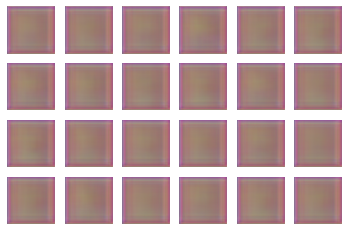

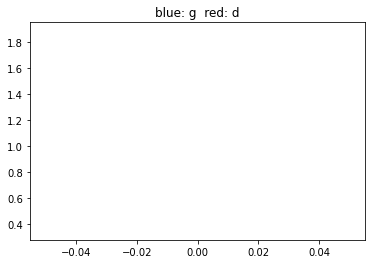


epochs 2
steps128
d loss: 1.6866, g loss: 0.8719
epoch time: 146.4576 [sec]


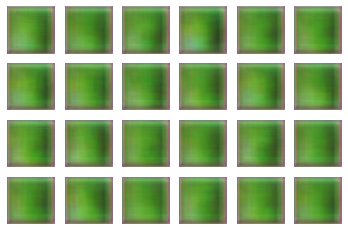

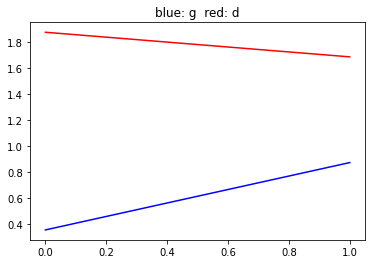


epochs 3
steps128
d loss: 1.6799, g loss: 0.8803
epoch time: 146.5631 [sec]


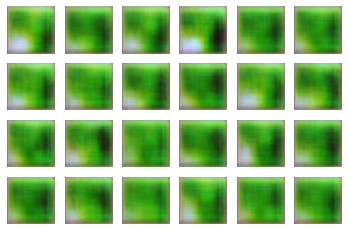

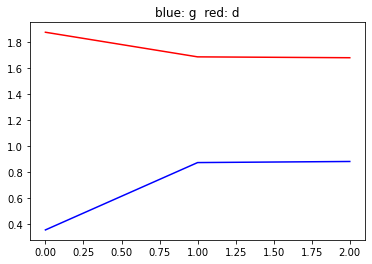


epochs 4
steps128
d loss: 1.7667, g loss: 0.8301
epoch time: 146.7408 [sec]


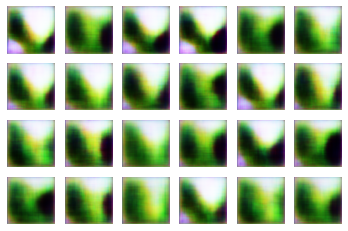

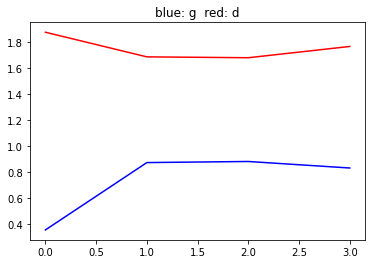


epochs 5
steps128
d loss: 1.8421, g loss: 0.8653
epoch time: 146.6337 [sec]


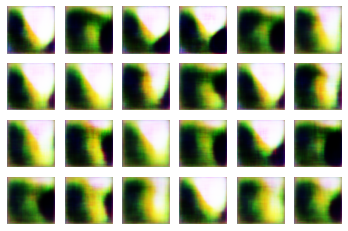

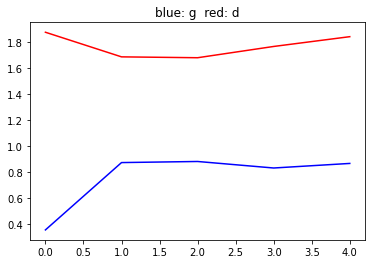


epochs 6
steps128
d loss: 1.8461, g loss: 0.8209
epoch time: 146.8300 [sec]


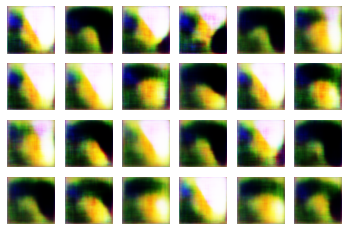

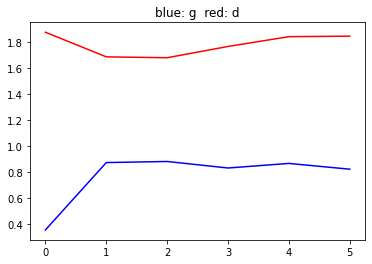


epochs 7
steps128
d loss: 1.8647, g loss: 0.7980
epoch time: 146.2702 [sec]


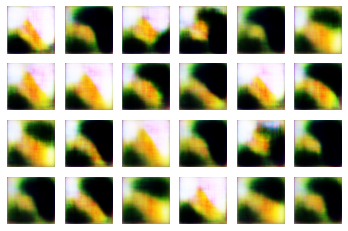

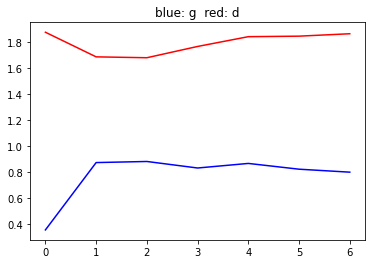


epochs 8
steps128
d loss: 1.8600, g loss: 0.8487
epoch time: 146.5707 [sec]


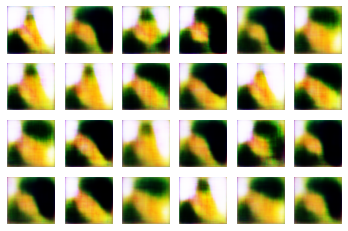

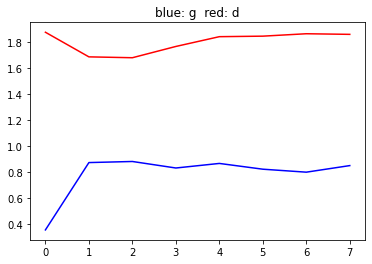


epochs 9
steps128
d loss: 1.8191, g loss: 0.8679
epoch time: 146.4151 [sec]


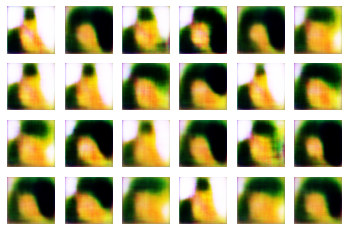

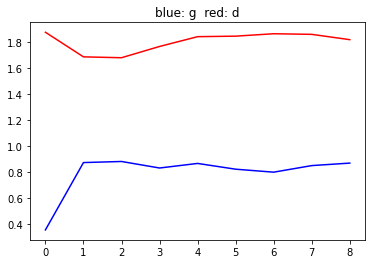


epochs 10
steps128
d loss: 1.7984, g loss: 0.8707
epoch time: 146.4683 [sec]


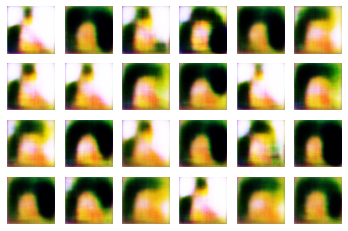

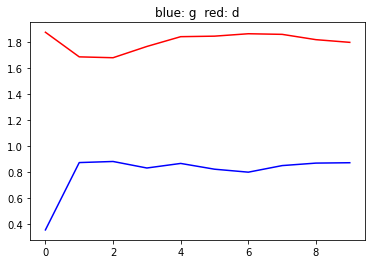


epochs 11
steps128
d loss: 1.7712, g loss: 0.8821
epoch time: 146.4710 [sec]


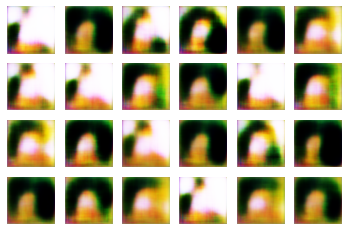

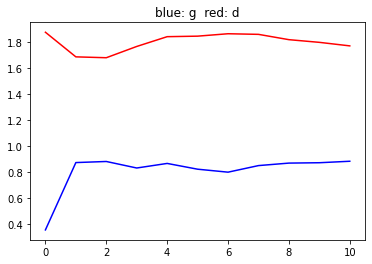


epochs 12
steps128
d loss: 1.7410, g loss: 0.8838
epoch time: 146.5875 [sec]


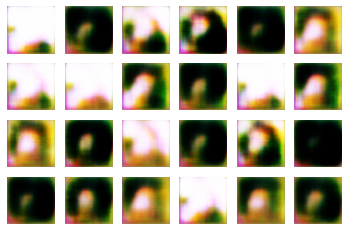

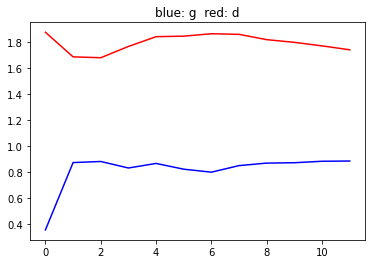


epochs 13
steps128
d loss: 1.7417, g loss: 0.8818
epoch time: 146.4961 [sec]


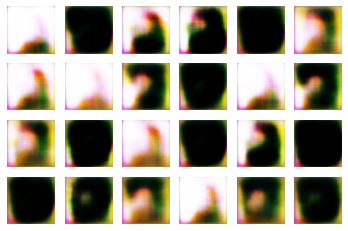

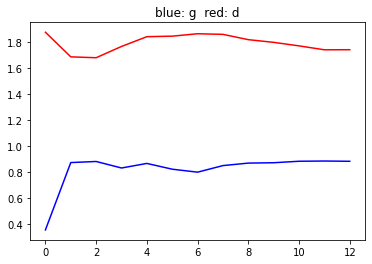


epochs 14
steps128
d loss: 1.7232, g loss: 0.8876
epoch time: 146.5846 [sec]


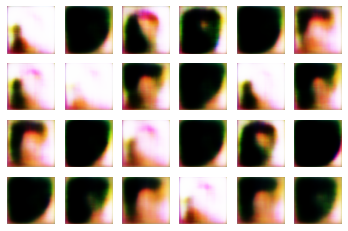

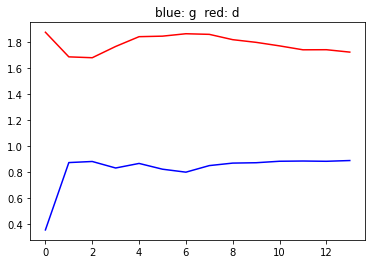


epochs 15
steps128
d loss: 1.7094, g loss: 0.9018
epoch time: 146.4649 [sec]


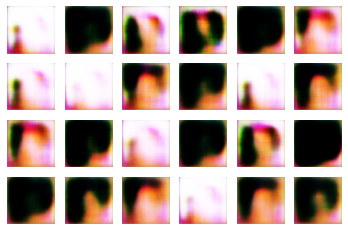

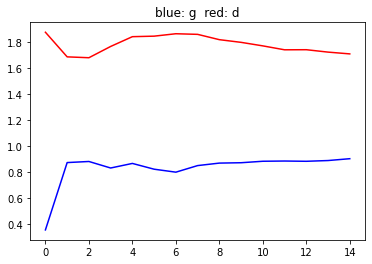


epochs 16
steps128
d loss: 1.7098, g loss: 0.9023
epoch time: 146.2880 [sec]


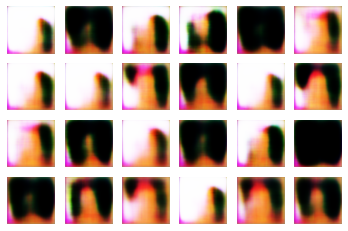

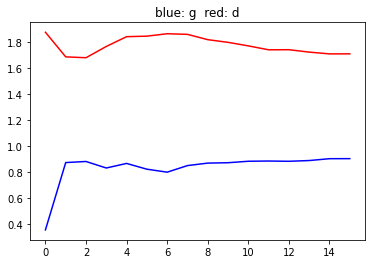


epochs 17
steps128
d loss: 1.6834, g loss: 0.9121
epoch time: 146.5518 [sec]


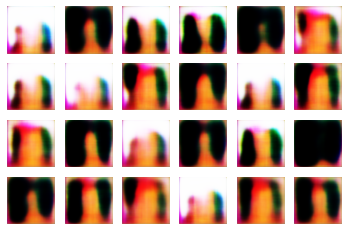

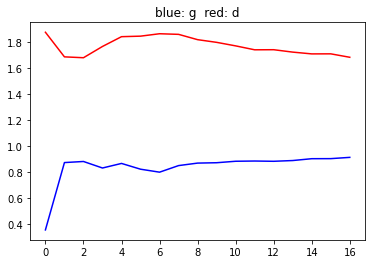


epochs 18
steps128
d loss: 1.6741, g loss: 0.9169
epoch time: 146.4549 [sec]


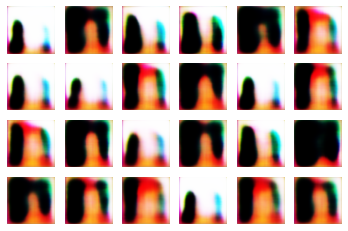

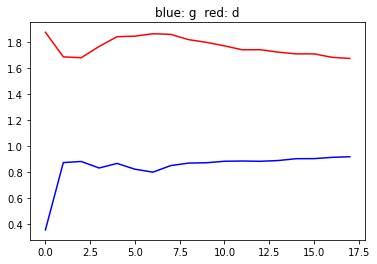


epochs 19
steps128
d loss: 1.6649, g loss: 0.9178
epoch time: 146.3820 [sec]


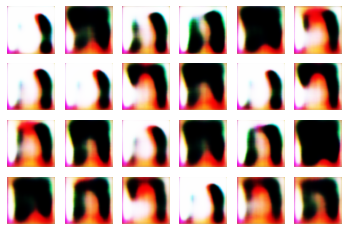

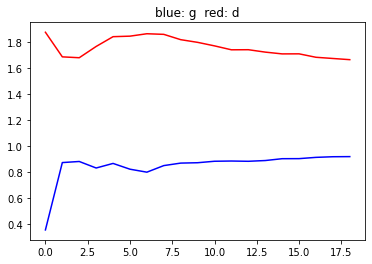


epochs 20
steps128
d loss: 1.6456, g loss: 0.9209
epoch time: 146.3857 [sec]


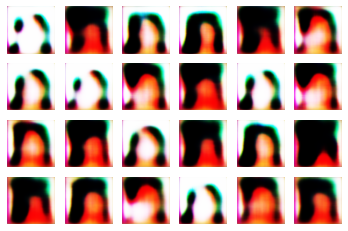

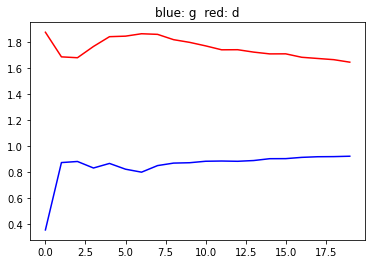


epochs 21
steps128
d loss: 1.6494, g loss: 0.9333
epoch time: 146.2253 [sec]


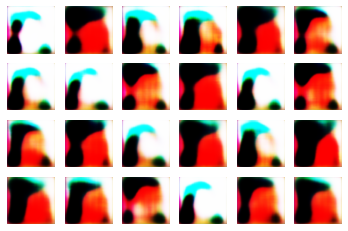

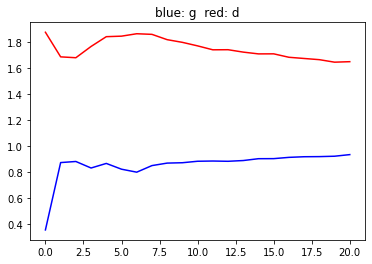


epochs 22
steps128
d loss: 1.6417, g loss: 0.9369
epoch time: 146.5484 [sec]


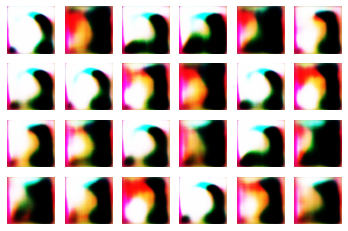

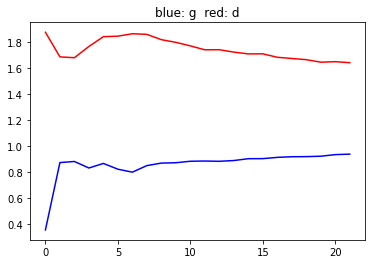


epochs 23
steps128
d loss: 1.6098, g loss: 0.9312
epoch time: 146.3224 [sec]


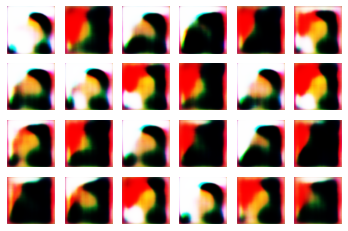

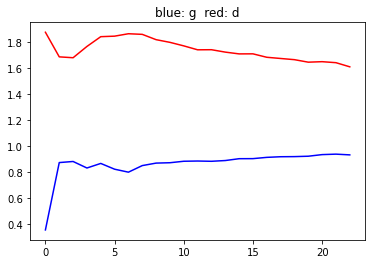


epochs 24
steps128
d loss: 1.6472, g loss: 0.9140
epoch time: 146.3777 [sec]


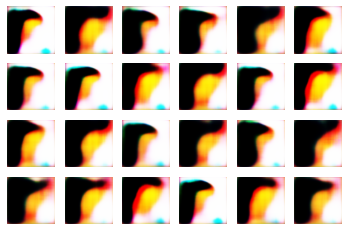

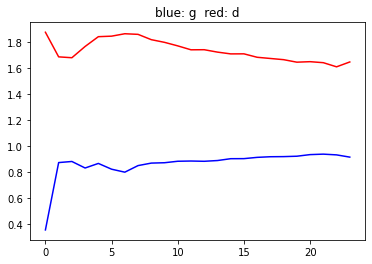


epochs 25
steps128
d loss: 1.5917, g loss: 0.9407
epoch time: 146.6445 [sec]


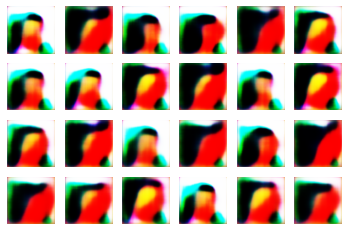

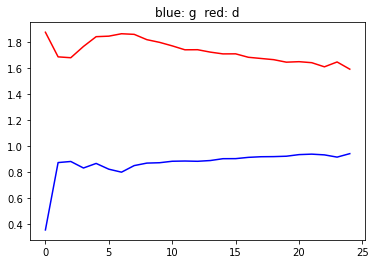


epochs 26
steps128
d loss: 1.6091, g loss: 0.9346
epoch time: 146.5263 [sec]


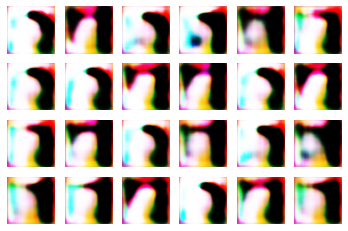

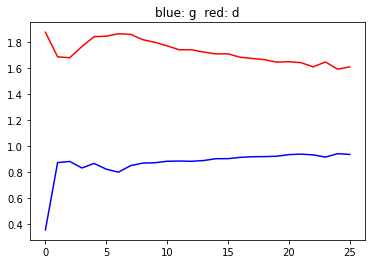


epochs 27
steps128
d loss: 1.5857, g loss: 0.9154
epoch time: 146.3936 [sec]


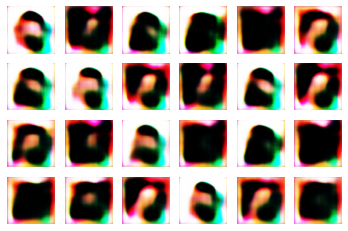

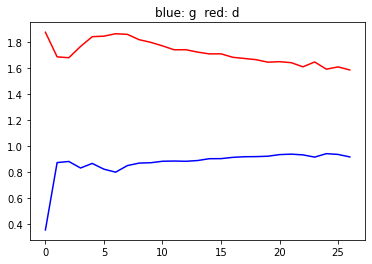


epochs 28
steps128
d loss: 1.5928, g loss: 0.9256
epoch time: 146.2941 [sec]


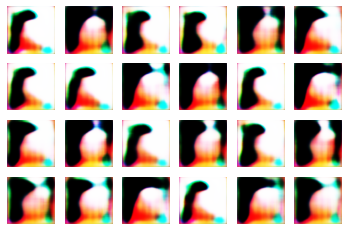

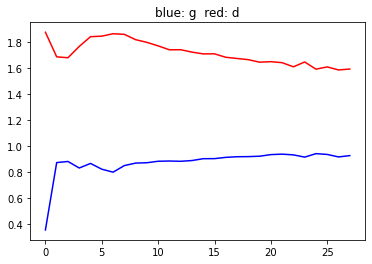


epochs 29
steps128
d loss: 1.5715, g loss: 0.9463
epoch time: 146.5816 [sec]


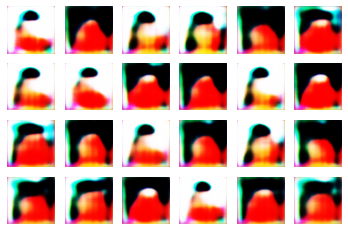

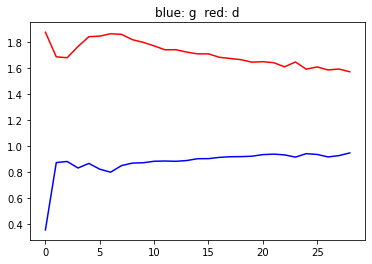


epochs 30
steps128
d loss: 1.5649, g loss: 0.9306
epoch time: 146.6445 [sec]


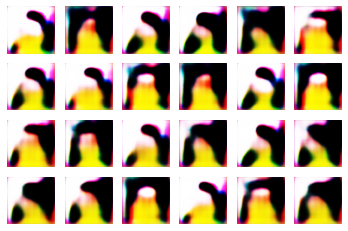

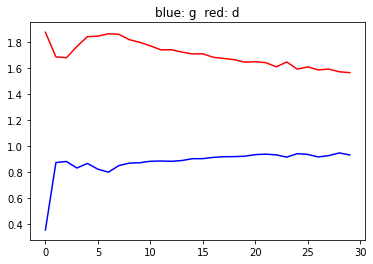


epochs 31
steps128
d loss: 1.5562, g loss: 0.9109
epoch time: 146.4958 [sec]


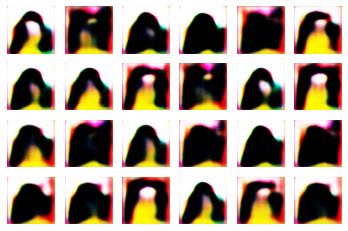

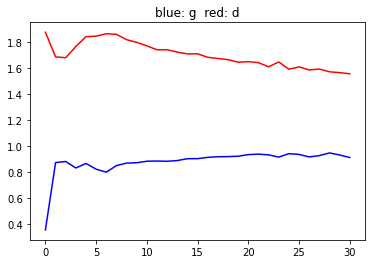


epochs 32
steps128
d loss: 1.5365, g loss: 0.9175
epoch time: 146.6745 [sec]


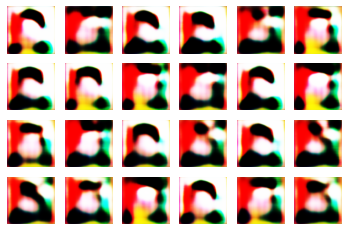

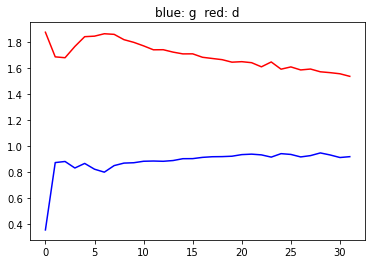


epochs 33
steps128
d loss: 1.5582, g loss: 0.9627
epoch time: 146.3565 [sec]


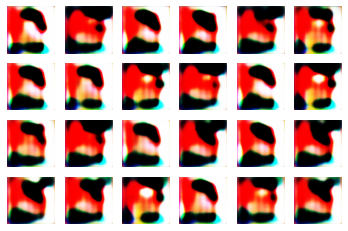

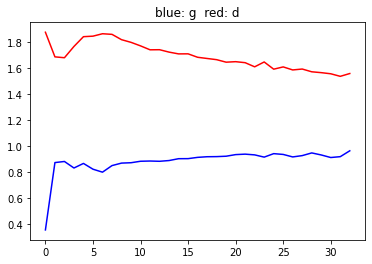


epochs 34
steps128
d loss: 1.5173, g loss: 0.9566
epoch time: 146.6657 [sec]


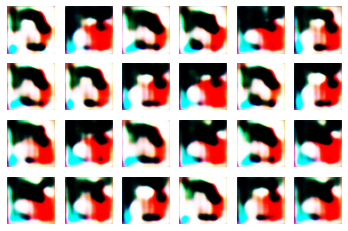

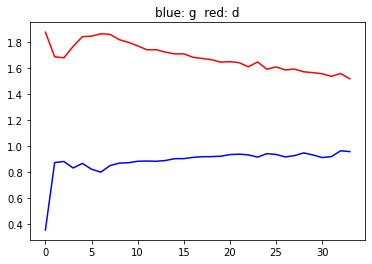


epochs 35
steps128
d loss: 1.5137, g loss: 0.9386
epoch time: 146.3758 [sec]


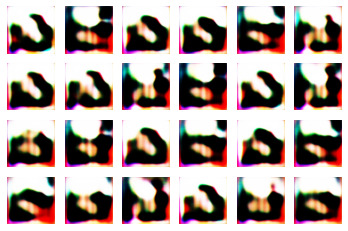

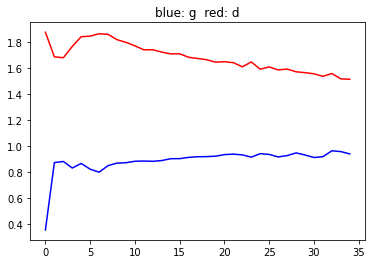


epochs 36
steps128
d loss: 1.5358, g loss: 0.9215
epoch time: 146.4604 [sec]


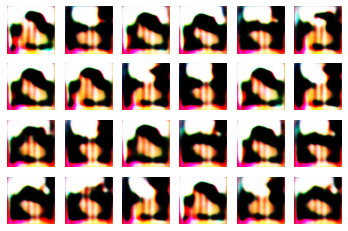

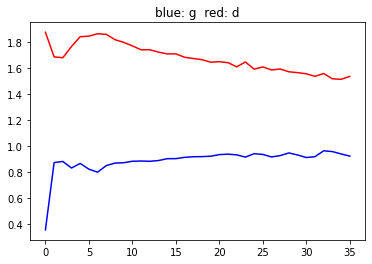


epochs 37
steps128
d loss: 1.5504, g loss: 0.9331
epoch time: 146.9919 [sec]


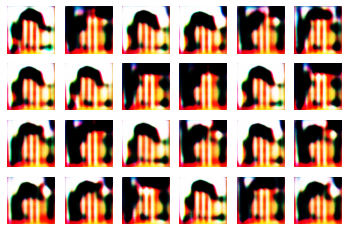

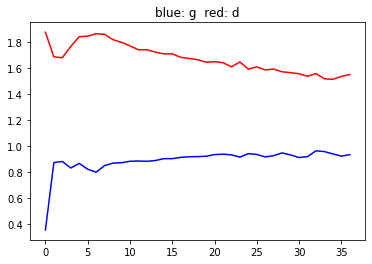


epochs 38
steps128
d loss: 1.5676, g loss: 0.9493
epoch time: 146.4875 [sec]


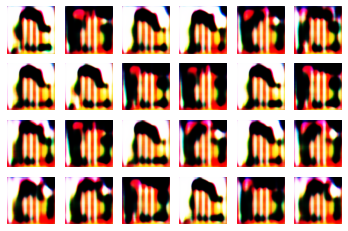

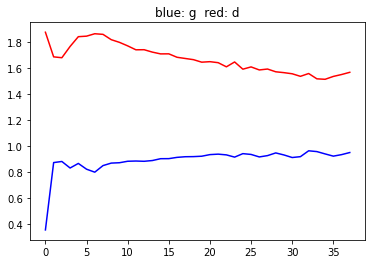


epochs 39
steps128
d loss: 1.5501, g loss: 0.9397
epoch time: 146.3600 [sec]


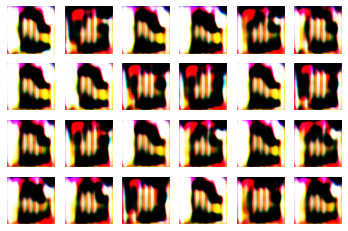

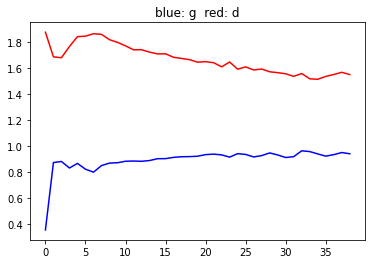


epochs 40
steps128
d loss: 1.5219, g loss: 0.9361
epoch time: 146.4934 [sec]


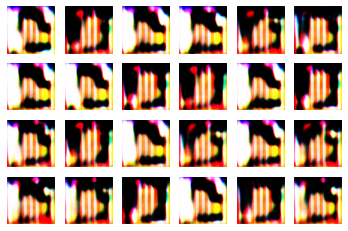

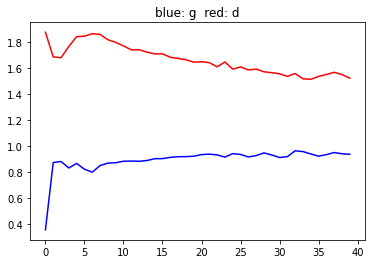


epochs 41
steps128
d loss: 1.5079, g loss: 0.9511
epoch time: 146.2899 [sec]


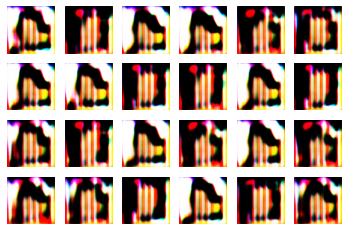

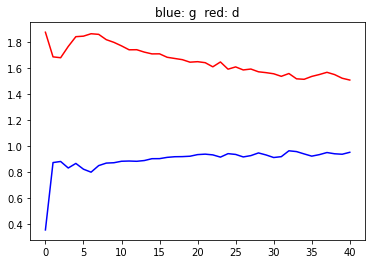


epochs 42
steps128
d loss: 1.4816, g loss: 0.9434
epoch time: 146.1759 [sec]


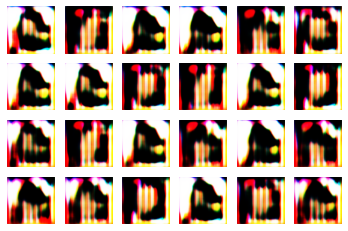

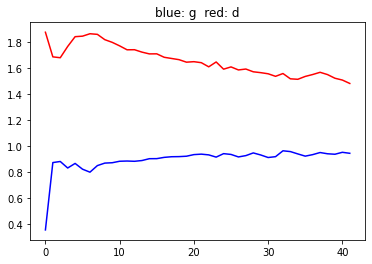


epochs 43
steps128
d loss: 1.4544, g loss: 0.9427
epoch time: 146.3536 [sec]


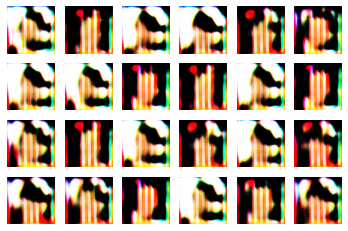

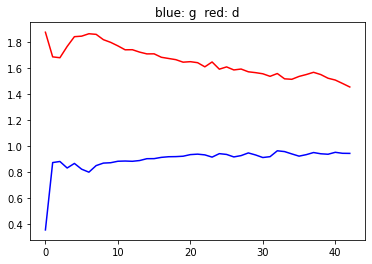


epochs 44
steps128
d loss: 1.4418, g loss: 0.9393
epoch time: 146.2287 [sec]


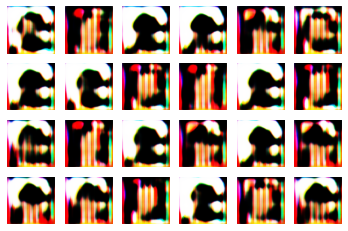

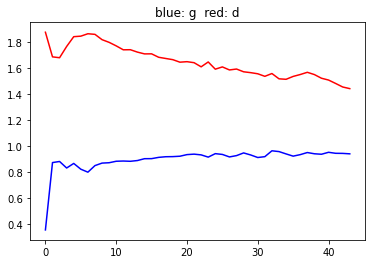


epochs 45
steps128
d loss: 1.4136, g loss: 0.9387
epoch time: 146.2787 [sec]


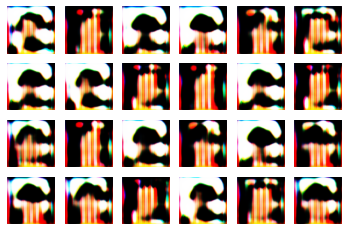

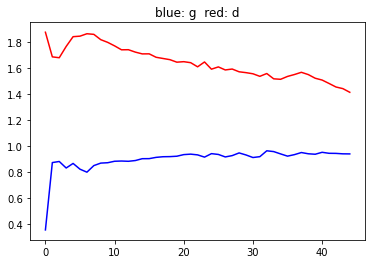


epochs 46
steps128
d loss: 1.3872, g loss: 0.9352
epoch time: 146.7849 [sec]


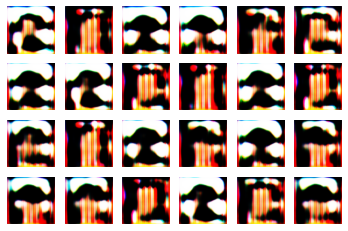

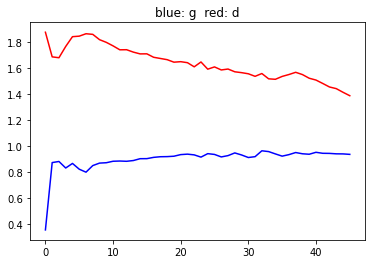


epochs 47
steps128
d loss: 1.3527, g loss: 0.9275
epoch time: 146.7047 [sec]


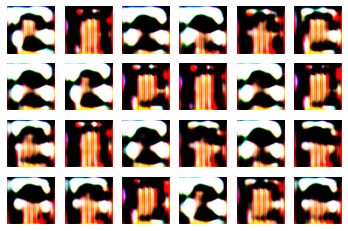

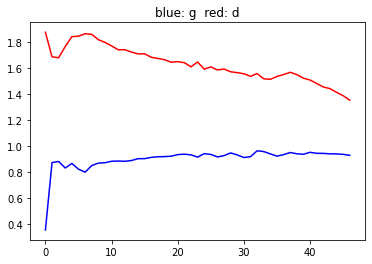


epochs 48
steps128
d loss: 1.3098, g loss: 0.9245
epoch time: 146.2668 [sec]


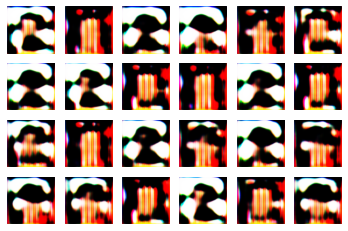

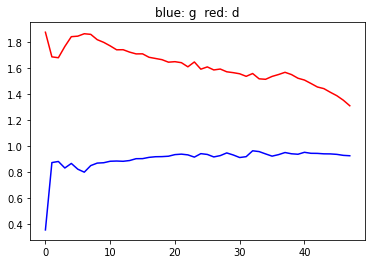


epochs 49
steps128
d loss: 1.2680, g loss: 0.9212
epoch time: 146.0539 [sec]


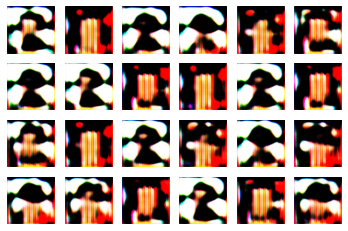

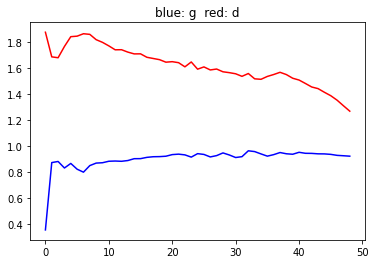


epochs 50
steps128
d loss: 1.2177, g loss: 0.9149
epoch time: 146.4400 [sec]


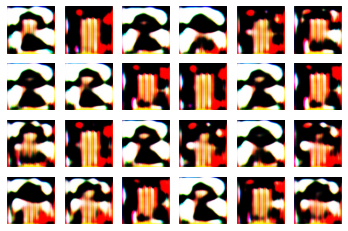

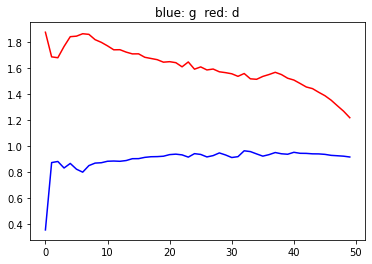


epochs 51
steps128
d loss: 1.1573, g loss: 0.9186
epoch time: 146.2893 [sec]


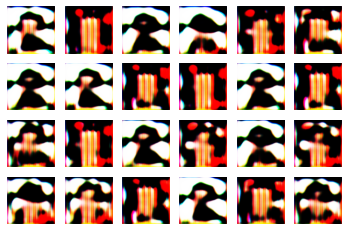

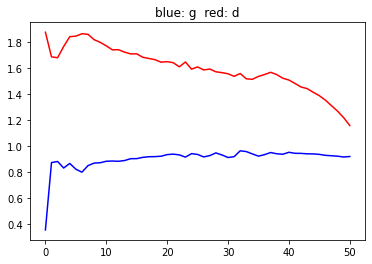


epochs 52
steps128
d loss: 1.0916, g loss: 0.9125
epoch time: 146.5913 [sec]


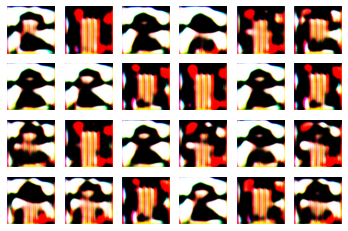

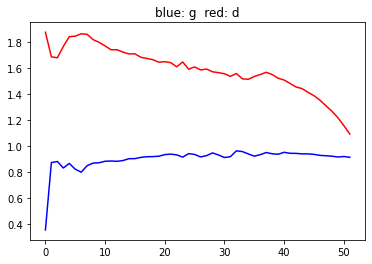


epochs 53
steps128
d loss: 1.0234, g loss: 0.9100
epoch time: 146.2750 [sec]


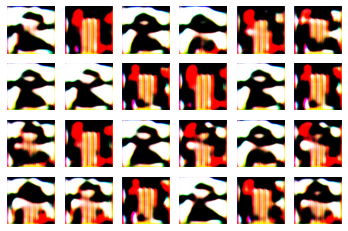

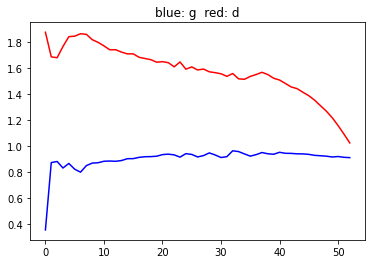


epochs 54
steps128
d loss: 0.9438, g loss: 0.9199
epoch time: 146.3581 [sec]


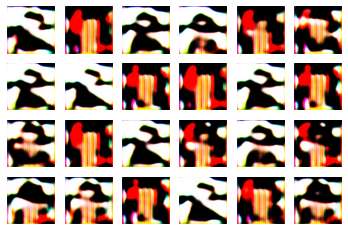

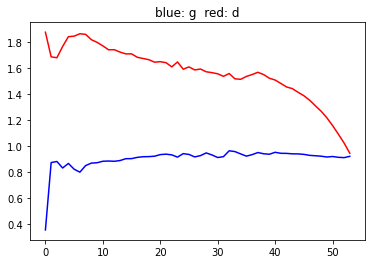


epochs 55
steps128
d loss: 0.8791, g loss: 0.9445
epoch time: 146.2012 [sec]


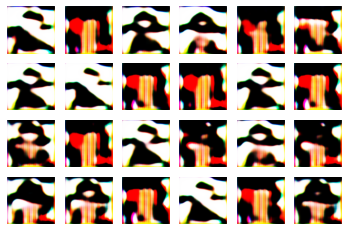

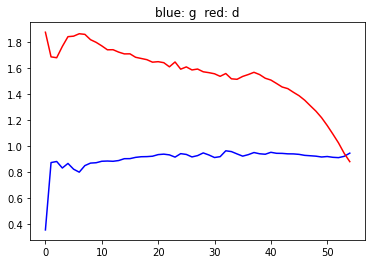


epochs 56
steps128
d loss: 0.8213, g loss: 0.9709
epoch time: 146.0354 [sec]


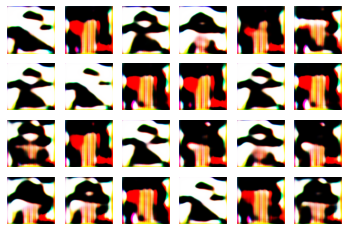

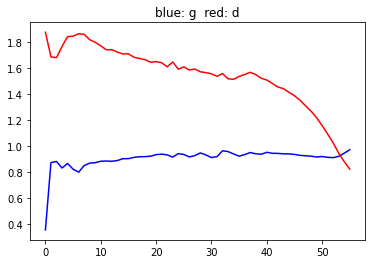


epochs 57
steps128
d loss: 0.7650, g loss: 1.0122
epoch time: 146.0401 [sec]


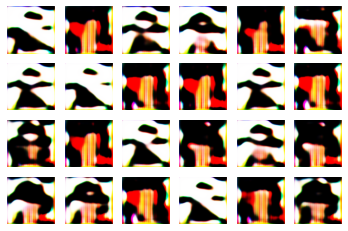

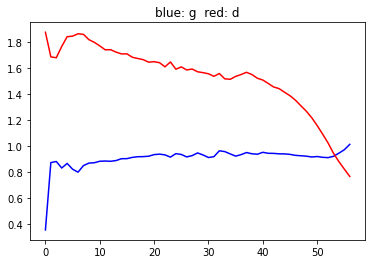


epochs 58
steps128
d loss: 0.7202, g loss: 1.0482
epoch time: 146.2008 [sec]


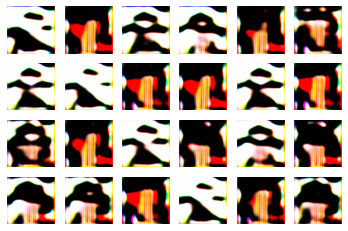

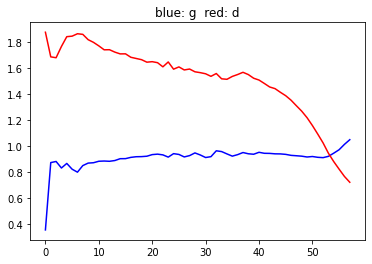


epochs 59
steps128
d loss: 0.6820, g loss: 1.0788
epoch time: 146.2755 [sec]


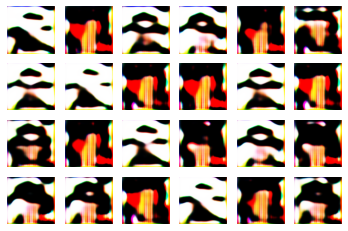

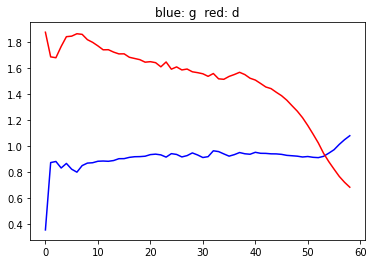


epochs 60
steps128
d loss: 0.6644, g loss: 1.1155
epoch time: 146.2593 [sec]


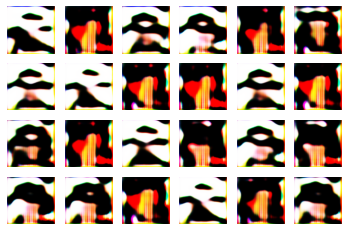

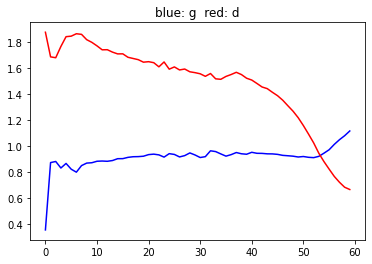


epochs 61
steps128
d loss: 0.6403, g loss: 1.1442
epoch time: 146.0864 [sec]


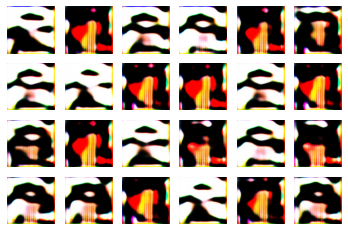

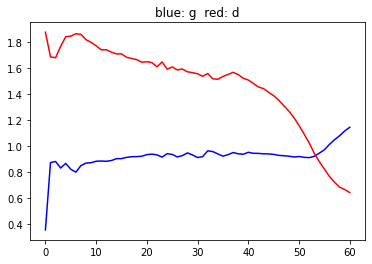


epochs 62
steps128
d loss: 0.6123, g loss: 1.1693
epoch time: 145.9974 [sec]


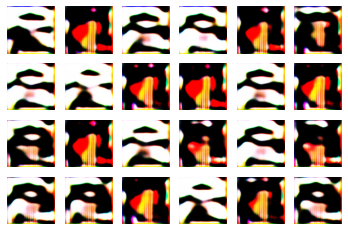

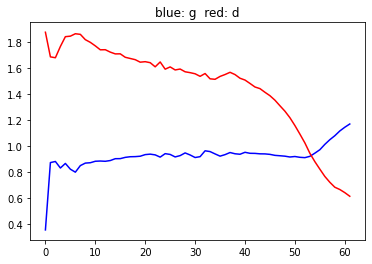


epochs 63
steps128
d loss: 0.6040, g loss: 1.1902
epoch time: 145.9800 [sec]


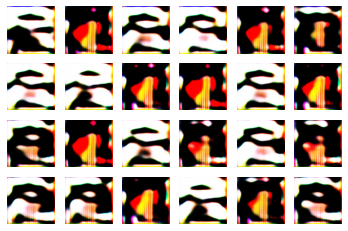

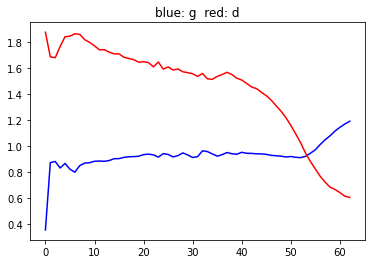


epochs 64
steps128
d loss: 0.5789, g loss: 1.2183
epoch time: 146.1803 [sec]


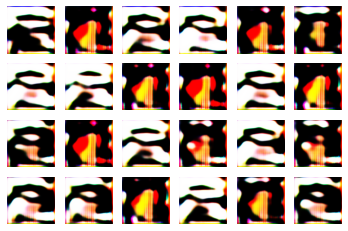

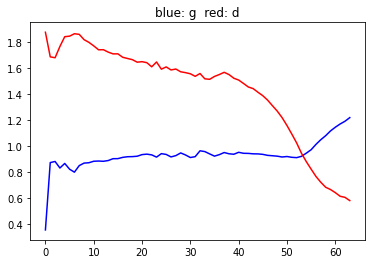


epochs 65
steps128
d loss: 0.5746, g loss: 1.2461
epoch time: 146.1961 [sec]


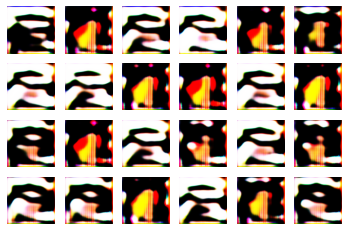

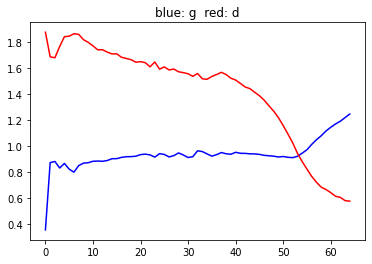


epochs 66
steps128
d loss: 0.5443, g loss: 1.2739
epoch time: 146.4403 [sec]


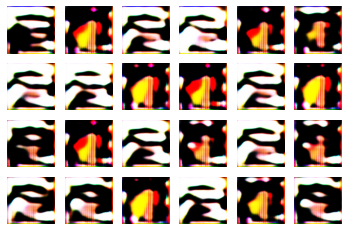

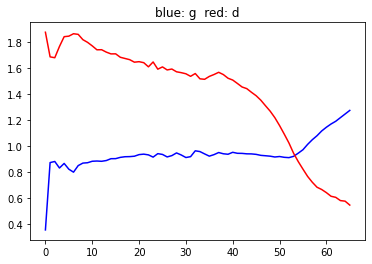


epochs 67
steps128
d loss: 0.5340, g loss: 1.2954
epoch time: 146.0199 [sec]


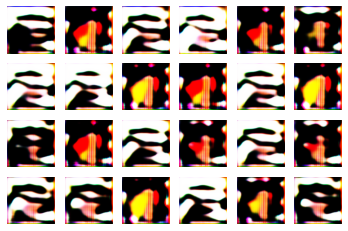

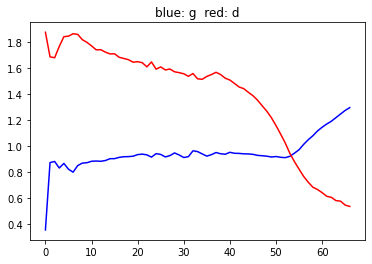


epochs 68
steps128
d loss: 0.5382, g loss: 1.3103
epoch time: 146.1704 [sec]


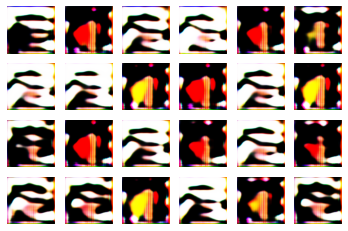

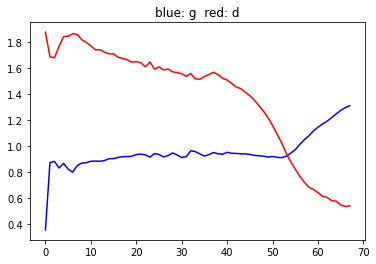


epochs 69
steps128
d loss: 0.5195, g loss: 1.3337
epoch time: 146.4782 [sec]


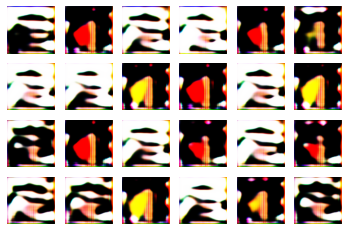

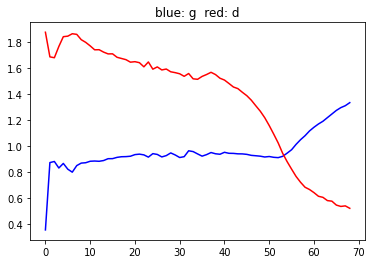


epochs 70
steps128
d loss: 0.5209, g loss: 1.3310
epoch time: 146.1525 [sec]


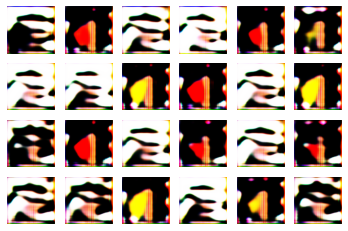

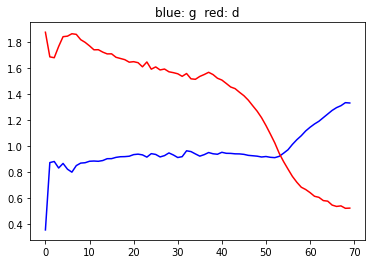


epochs 71
steps128
d loss: 0.5029, g loss: 1.3510
epoch time: 146.0889 [sec]


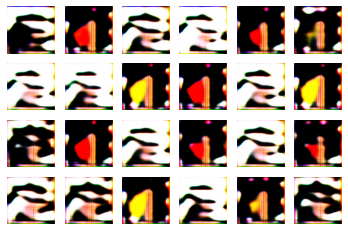

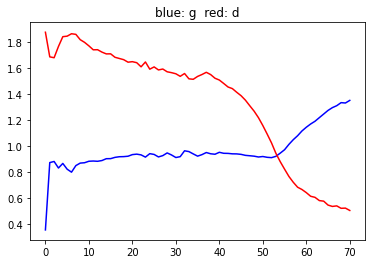


epochs 72
steps128
d loss: 0.4981, g loss: 1.3817
epoch time: 146.0999 [sec]


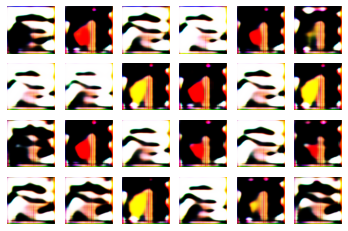

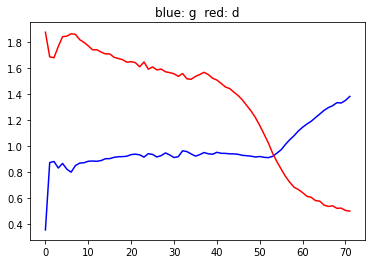


epochs 73
steps128
d loss: 0.4935, g loss: 1.3854
epoch time: 146.1251 [sec]


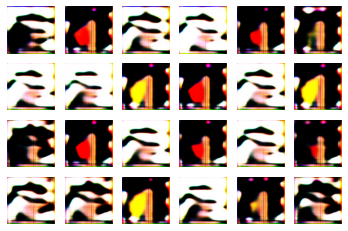

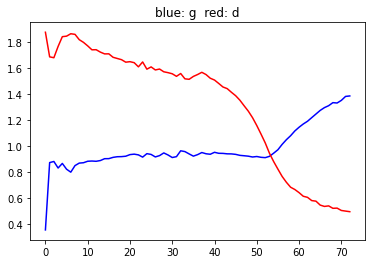


epochs 74
steps128
d loss: 0.4756, g loss: 1.3999
epoch time: 145.7921 [sec]


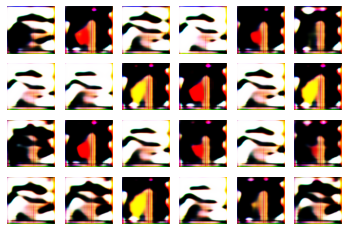

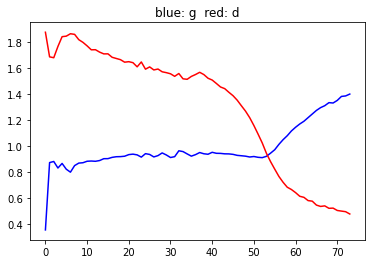


epochs 75
steps128
d loss: 0.4695, g loss: 1.4128
epoch time: 146.0507 [sec]


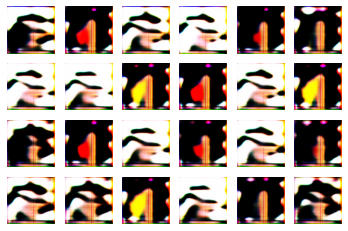

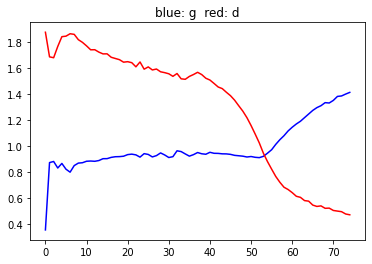


epochs 76
steps128
d loss: 0.4693, g loss: 1.4201
epoch time: 145.9650 [sec]


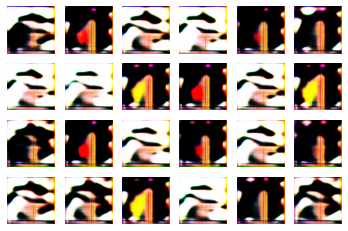

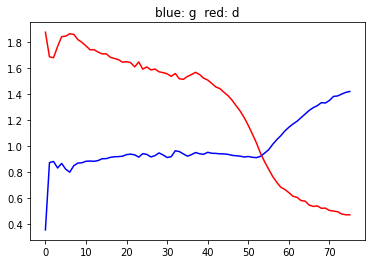


epochs 77
steps128
d loss: 0.4516, g loss: 1.4386
epoch time: 146.1615 [sec]


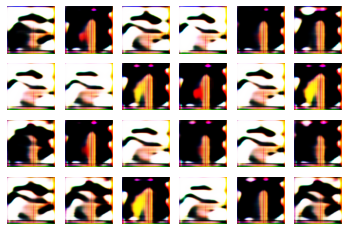

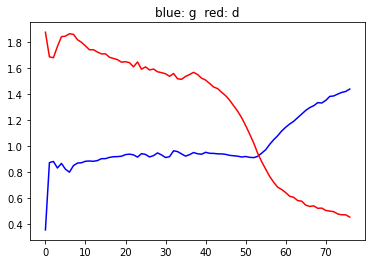


epochs 78
steps74

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.losses import binary_crossentropy, MSE
import glob
import time
import random
import sys
import keras.backend as K

class GAN():
  def __init__(self, 
               img_size= 128, 
               code_num = 2048,
               batch_size = 16, 
               train_epochs = 100, 
               train_steps = 8, 
               checkpoint_epochs = 25, 
               image_epochs = 1, 
               start_epoch = 1,
               optimizer = Adam(learning_rate = 1e-4),
               n_critics = 8,
               gp_lamda = 0.1
               ):
    
    self.batch_size = batch_size
    self.train_epochs =  train_epochs
    self.train_steps = train_steps
    self.checkpoint_epochs = checkpoint_epochs
    self.image_epochs = image_epochs
    self.start_epoch = start_epoch
    self.code_num = code_num
    self.img_size = img_size
    self.n_critics = n_critics
    self.gp_lamda = gp_lamda
    
    self.gen_optimizer = optimizer
    self.disc_optimizer = optimizer

    g = Generator()
    self.gen = g.model()
    
    d = Discriminator()
    self.disc = d.model()

    checkpoint_dir = "drive/My Drive/SNGAN/checkpoint"
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    checkpoint = tf.train.Checkpoint(gen_optimizer = self.gen_optimizer,
                                     disc_optimizer = self.disc_optimizer,
                                     gen = self.gen,
                                     disc = self.disc,
                                     )

    self.manager = tf.train.CheckpointManager(checkpoint, directory=checkpoint_dir, max_to_keep=2)

    train_image_path = 'data_faces/img_align_celeba'
    
    self.train_filenames = glob.glob(train_image_path + '/*.jpg') 

    checkpoint.restore(self.manager.latest_checkpoint)

    self.g_history = []
    self.d_history = []
    # self.endec_history = []  

  def preprocess_image(self, image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [self.img_size, self.img_size] )
    image = image*2 /255 - 1  # normalize to [-1,1] range
    return tf.cast(image, tf.float32)

  def load_and_preprocess_image(self, path):
    image = tf.io.read_file(path)
    return self.preprocess_image(image)

  def dataset(self, paths, batch_size):
    AUTOTUNE = tf.data.experimental.AUTOTUNE
    path_ds = tf.data.Dataset.from_tensor_slices(paths)
    img_ds = path_ds.map(self.load_and_preprocess_image, num_parallel_calls=AUTOTUNE)
    img_ds = img_ds.batch(batch_size)
    return img_ds

  def image_preparation(self, filenames, batch_size, steps):
    img_batch = []
    while 1:
      random.shuffle(filenames)
      for path in filenames:
        img_batch.append(path)
        if len(img_batch) == steps*batch_size:
          imgs = self.dataset(img_batch, batch_size)
          img_batch = []
          yield imgs

  def gan_loss(self, original_outputs, generated_outputs):
    real_loss = binary_crossentropy(tf.ones_like(original_outputs), original_outputs)
    generated_loss = binary_crossentropy(tf.zeros_like(generated_outputs), generated_outputs)
    d_loss = tf.math.reduce_mean(real_loss + generated_loss)
    g_loss = tf.math.reduce_mean(binary_crossentropy(tf.ones_like(generated_outputs), generated_outputs))
    return d_loss, g_loss


  def wasserstein_loss(self, ori_outputs, gen_outputs):
    d_loss = -tf.reduce_mean(ori_outputs) + tf.reduce_mean(gen_outputs)
    g_loss = -tf.reduce_mean(gen_outputs)
    return d_loss, g_loss

  def w_gp_loss(self, ori_outputs, gen_outputs, imgs, gen_imgs):
    d_loss = -tf.reduce_mean(ori_outputs) + tf.reduce_mean(gen_outputs)
    g_loss = -tf.reduce_mean(gen_outputs)

    alpha = tf.random.uniform(shape=[self.batch_size, 1, 1, 1], minval=0, maxval=1, dtype=tf.dtypes.float32)
    inter_sample = alpha * imgs + (1-alpha) * gen_imgs
    with tf.GradientTape() as tape_gp:
      tape_gp.watch(inter_sample)
      inter_score = self.disc(inter_sample)
    gp_gradients = tape_gp.gradient(inter_score, inter_sample)
    gp_gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gp_gradients), axis = [1, 2, 3]))
    gp = tf.reduce_mean((gp_gradients_norm - 1.0) ** 2)

    d_loss += gp * self.gp_lamda
    
    return d_loss, g_loss


  def hinge_loss(self, ori_outputs, gen_outputs):
    d_loss = K.mean(K.relu(1 - ori_outputs)) + K.mean(K.relu(1 + gen_outputs))
    g_loss =  -1 * K.mean(gen_outputs)
    return d_loss, g_loss
    

  def gan_train(self, imgs):
    noise =tf.random.uniform([self.batch_size, self.code_num], minval=0, maxval=1, dtype=tf.dtypes.float32)

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      gen_imgs = self.gen(noise, training=True)

      ori_outputs = self.disc(imgs, training=True)
      gen_outputs = self.disc(gen_imgs, training=True)

      d_loss, g_loss = self.hinge_loss(ori_outputs, gen_outputs)
      # d_loss, g_loss = self.w_gp_loss(ori_outputs, gen_outputs, imgs, gen_imgs)

      self.g_temp.append(g_loss)
      self.d_temp.append(d_loss)

    gradients_of_gen = gen_tape.gradient(g_loss, self.gen.trainable_variables)
    self.gen_optimizer.apply_gradients(zip(gradients_of_gen, self.gen.trainable_variables))

    gradients_of_disc = disc_tape.gradient(d_loss, self.disc.trainable_variables)    
    self.disc_optimizer.apply_gradients(zip(gradients_of_disc, self.disc.trainable_variables))

  def g_train(self, imgs):
    noise =tf.random.uniform([self.batch_size, self.code_num], minval=0, maxval=1, dtype=tf.dtypes.float32)

    with tf.GradientTape() as gen_tape:
      gen_imgs = self.gen(noise, training=True)

      ori_outputs = self.disc(imgs, training=False)
      gen_outputs = self.disc(gen_imgs, training=False)

      _, g_loss = self.hinge_loss(ori_outputs, gen_outputs)
      self.g_temp.append(g_loss)

    gradients_of_gen = gen_tape.gradient(g_loss, self.gen.trainable_variables)
    self.gen_optimizer.apply_gradients(zip(gradients_of_gen, self.gen.trainable_variables))

  def d_train(self, imgs):
    noise =tf.random.uniform([self.batch_size, self.code_num], minval=0, maxval=1, dtype=tf.dtypes.float32)

    with tf.GradientTape() as disc_tape:
      gen_imgs = self.gen(noise, training=False)

      ori_outputs = self.disc(imgs, training=True)
      gen_outputs = self.disc(gen_imgs, training=True)
      
      d_loss, _ = self.hinge_loss(ori_outputs, gen_outputs)
      self.d_temp.append(d_loss)

    gradients_of_disc = disc_tape.gradient(d_loss, self.disc.trainable_variables)    
    self.disc_optimizer.apply_gradients(zip(gradients_of_disc, self.disc.trainable_variables))

  def visualise_batch(self, s_1, epoch):
    gen_img = self.gen(s_1)  
    gen_img = (np.array((gen_img+1)*255/2, np.uint8))
    fig, axes = plt.subplots(4, 6)
    for idx, img in enumerate(gen_img):
      p, q = idx//6, idx%6
      axes[p, q].imshow(img)
      axes[p, q].axis('off')
    
    save_name = 'drive/My Drive/SNGAN/generated_image/'+'image_at_epoch_{:04d}.png'
    plt.savefig(save_name.format(epoch), dpi=100)
    plt.pause(0.1)
    plt.close('all')

  def loss_vis(self):
    plt.plot(self.g_history, 'b', self.d_history, 'r')
    plt.title('blue: g  red: d')
    plt.savefig('drive/My Drive/SNGAN/loss/gan_loss.png')
    plt.pause(0.1)
    plt.close('all')

  def update_loss_history(self):
    d_batch_loss = sum(self.d_temp)/len(self.d_temp)
    g_batch_loss = sum(self.g_temp)/len(self.g_temp)
    print ('\nd loss: {:.4f}, g loss: {:.4f}'.format(d_batch_loss, g_batch_loss))
    self.d_history.append(d_batch_loss)
    self.g_history.append(g_batch_loss)
    self.d_temp = []
    self.g_temp = []

  def __call__(self):
    sample_noise =tf.random.uniform([24, self.code_num], minval=0, maxval=1, dtype=tf.dtypes.float32)
    image_loader = self.image_preparation(self.train_filenames, self.batch_size, self.train_steps)
    self.d_temp = []
    self.g_temp = []

    for epoch in range(self.start_epoch, self.train_epochs+1):
      
      start_time = time.time()

      print ('\nepochs {}'.format(epoch))
      imgs_ds = next(image_loader)

      for steps, imgs in enumerate(imgs_ds):
        print("\r" + 'steps{}'.format(steps+1), end="")
        sys.stdout.flush()
        self.gan_train(imgs)

        # for img in imgs:
        #   plt.imshow(img)
        #   plt.pause(0.1)

        # self.d_train(imgs)

        # if steps % self.n_critics == 0:
        #   self.g_train(imgs)
        
      self.update_loss_history()

      epoch_time = time.time() - start_time
      print ("epoch time: {:.4f} [sec]".format(epoch_time))
                               
      if epoch % self.image_epochs == 0:
        self.visualise_batch(sample_noise, epoch)
        self.loss_vis()

      if epoch % self.checkpoint_epochs == 0:
        print ('\nSaving checkpoint at epoch{}\n\n'.format(epoch))
        self.manager.save()
      
if __name__ == '__main__':
  a = GAN(img_size = 128,
          code_num = 8,
          batch_size = 128,
          train_epochs = 10000, 
          train_steps = 128, 
          checkpoint_epochs = 100, 
          image_epochs = 1, 
          start_epoch = 1,
          optimizer = Adam(learning_rate = 1e-6),
          n_critics = 8,
          gp_lamda = 10
          )
  a()